In [ ]:
!pip install cleanvision

In [31]:
from pathlib import Path
from utils.move_images import move_images, move_specified_files
import os

source_dir = Path("../../datasets/raw/Dataset_Before_Cleaning/Close_Eye")
destination_dir = Path("../../datasets/raw/Images_with_Issues/Close_Eye")

Reading images from /Users/ahmedalkhulayfi/Desktop/Real-Time-Driver-Drowsiness-Detection/src/data/../../datasets/raw/Dataset_Before_Cleaning/Close_Eye
Checking for dark, light, odd_aspect_ratio, low_information, exact_duplicates, near_duplicates, blurry, grayscale, odd_size images ...


  0%|          | 0/14569 [00:00<?, ?it/s]

  0%|          | 0/14569 [00:00<?, ?it/s]

Issue checks completed. 9932 issues found in the dataset. To see a detailed report of issues found, use imagelab.report().
Issues found in images in order of severity in the dataset

|    | issue_type       |   num_images |
|---:|:-----------------|-------------:|
|  0 | blurry           |         2656 |
|  1 | grayscale        |         2000 |
|  2 | odd_aspect_ratio |         1937 |
|  3 | near_duplicates  |         1378 |
|  4 | odd_size         |          857 |
|  5 | dark             |          563 |
|  6 | exact_duplicates |          530 |
|  7 | low_information  |            9 |
|  8 | light            |            2 | 

---------------------- blurry images -----------------------

Number of examples with this issue: 2656
Examples representing most severe instances of this issue:



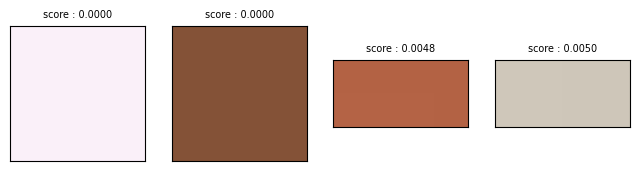

--------------------- grayscale images ---------------------

Number of examples with this issue: 2000
Examples representing most severe instances of this issue:



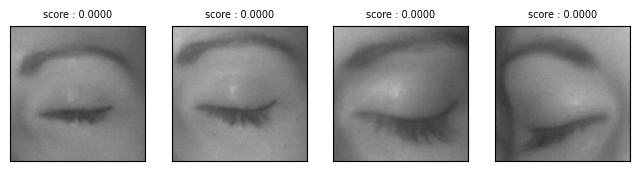

----------------- odd_aspect_ratio images ------------------

Number of examples with this issue: 1937
Examples representing most severe instances of this issue:



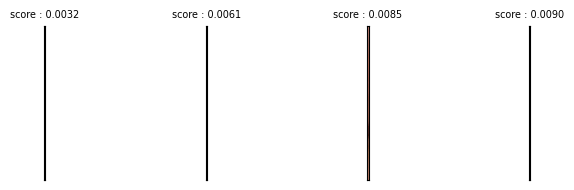

------------------ near_duplicates images ------------------

Number of examples with this issue: 1378
Examples representing most severe instances of this issue:

Set: 0


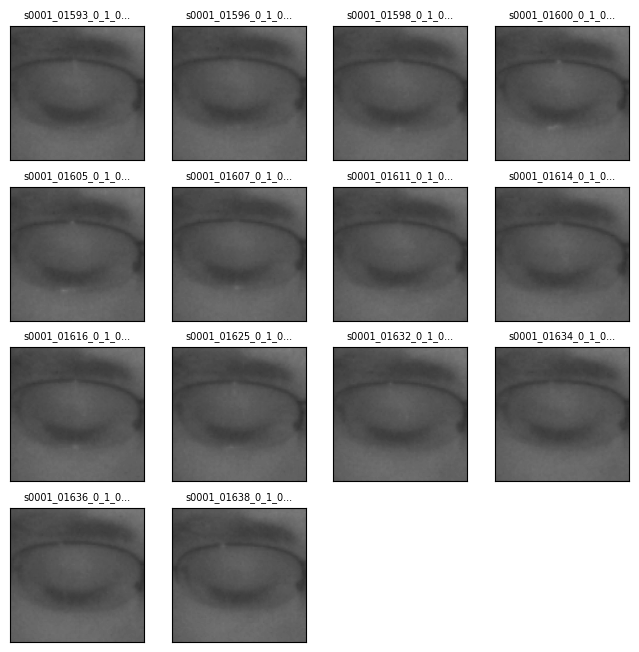

Set: 1


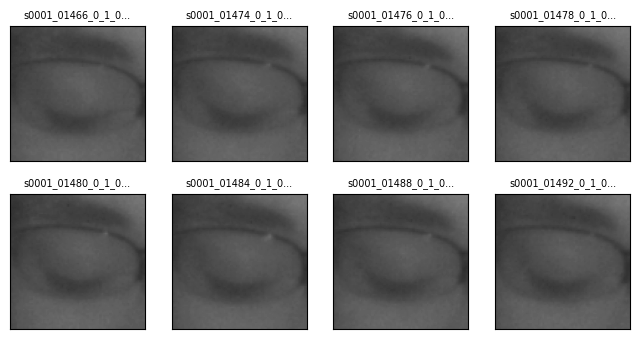

Set: 2


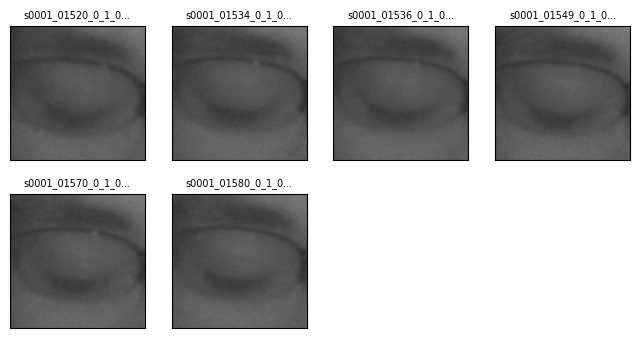

Set: 3


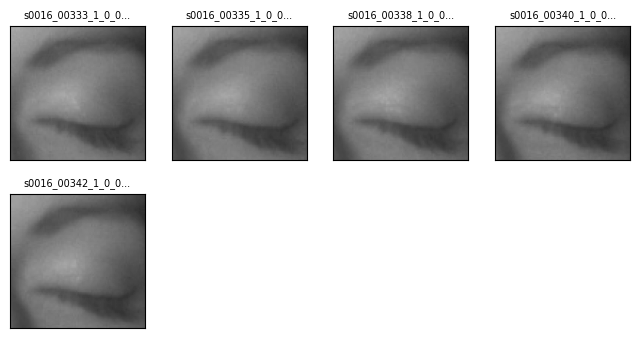

--------------------- odd_size images ----------------------

Number of examples with this issue: 857
Examples representing most severe instances of this issue:



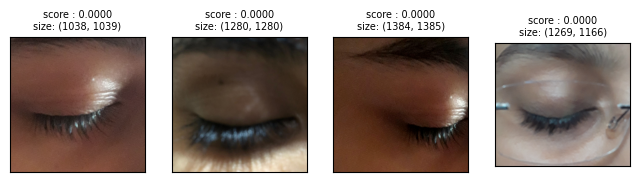

----------------------- dark images ------------------------

Number of examples with this issue: 563
Examples representing most severe instances of this issue:



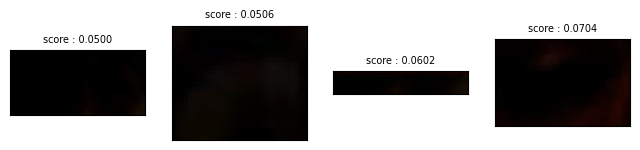

----------------- exact_duplicates images ------------------

Number of examples with this issue: 530
Examples representing most severe instances of this issue:

Set: 0


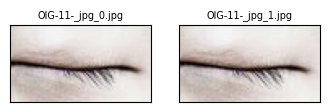

Set: 1


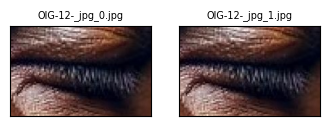

Set: 2


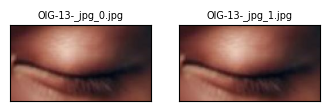

Set: 3


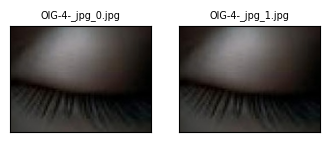

------------------ low_information images ------------------

Number of examples with this issue: 9
Examples representing most severe instances of this issue:



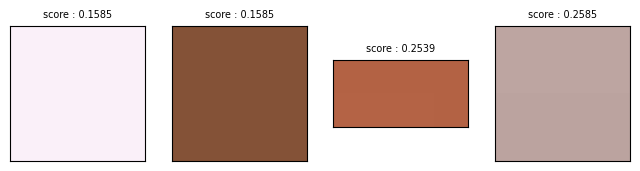

----------------------- light images -----------------------

Number of examples with this issue: 2
Examples representing most severe instances of this issue:



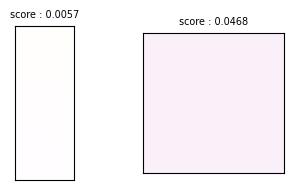

In [32]:
from cleanvision import Imagelab

# Specify path to folder containing the image files in your dataset
imagelab = Imagelab(data_path=source_dir)

# Automatically check for a predefined list of issues within your dataset
imagelab.find_issues()

# Produce a neat report of the issues found in your dataset
imagelab.report()

In [33]:
imagelab.issue_summary

,issue_type,num_images
0,blurry,2656
1,grayscale,2000
2,odd_aspect_ratio,1937
3,near_duplicates,1378
4,odd_size,857
5,dark,563
6,exact_duplicates,530
7,low_information,9
8,light,2


In [34]:
imagelab.issues.head()

,odd_size_score,is_odd_size_issue,odd_aspect_ratio_score,is_odd_aspect_ratio_issue,low_information_score,is_low_information_issue,light_score,is_light_issue,grayscale_score,is_grayscale_issue,dark_score,is_dark_issue,blurry_score,is_blurry_issue,exact_duplicates_score,is_exact_duplicates_issue,near_duplicates_score,is_near_duplicates_issue
/Users/ahmedalkhulayfi/Desktop/Real-Time-Driver-Drowsiness-Detection/src/data/../../datasets/raw/Dataset_Before_Cleaning/Close_Eye/--------------------------------------------------------------------119407273_jpeg_0.jpg,0.857356,False,0.454545,False,0.675676,False,0.959971,False,1,False,0.269004,True,0.170438,True,1.0,False,1.0,False
/Users/ahmedalkhulayfi/Desktop/Real-Time-Driver-Drowsiness-Detection/src/data/../../datasets/raw/Dataset_Before_Cleaning/Close_Eye/--------------1-_jpeg_0.jpg,0.859314,False,0.833333,False,0.817615,False,0.592801,False,1,False,0.912981,False,0.566474,False,1.0,False,1.0,False
/Users/ahmedalkhulayfi/Desktop/Real-Time-Driver-Drowsiness-Detection/src/data/../../datasets/raw/Dataset_Before_Cleaning/Close_Eye/------------_jpeg_0.jpg,0.861838,False,0.947368,False,0.823850,False,0.658726,False,1,False,0.857329,False,0.532836,False,1.0,False,1.0,False
/Users/ahmedalkhulayfi/Desktop/Real-Time-Driver-Drowsiness-Detection/src/data/../../datasets/raw/Dataset_Before_Cleaning/Close_Eye/-100-_png_0.jpg,0.875742,False,0.818182,False,0.441389,False,1.000000,False,1,False,0.247811,True,0.354399,False,1.0,False,1.0,False
/Users/ahmedalkhulayfi/Desktop/Real-Time-Driver-Drowsiness-Detection/src/data/../../datasets/raw/Dataset_Before_Cleaning/Close_Eye/-1003-_png_0.jpg,0.867962,False,0.958333,False,0.868313,False,0.606339,False,1,False,0.960622,False,0.503042,False,1.0,False,1.0,False


# Visualize the light images


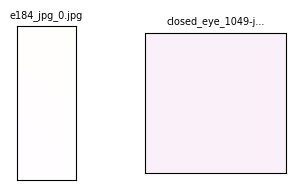

In [35]:
light_images = imagelab.issues[imagelab.issues["is_light_issue"] == True].sort_values(
    by=["light_score"]
)
light_image_files = light_images.index.tolist()
imagelab.visualize(image_files=light_image_files[:100])

In [36]:
move_images(light_image_files, destination_dir)

Moved: e184_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: closed_eye_1049-jpg_face_1_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye


# visualize the odd aspect ratio images


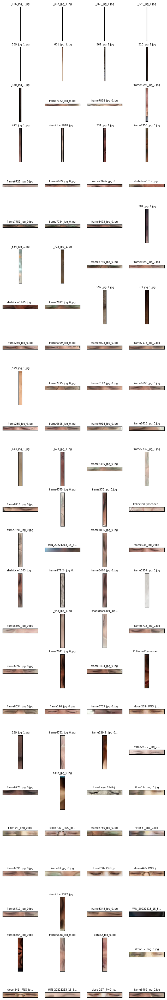

In [37]:
odd_aspect_ratio_images = imagelab.issues[imagelab.issues["is_odd_aspect_ratio_issue"] == True].sort_values(
    by=["odd_aspect_ratio_score"]
)
odd_aspect_ratio_image_files = odd_aspect_ratio_images.index.tolist()
existing_odd_aspect_ratio_image_files = [file for file in odd_aspect_ratio_image_files if os.path.exists(file)]
imagelab.visualize(image_files=existing_odd_aspect_ratio_image_files[:100])

In [38]:
move_images(existing_odd_aspect_ratio_image_files, destination_dir)

Moved: _136_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _467_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _366_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _228_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _589_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _631_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _561_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _310_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _370_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: frame7172_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: frame7878_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: frame5594_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _472_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: shahidcar1018_jpg_0.jpg to ..

# visualize the odd_size images


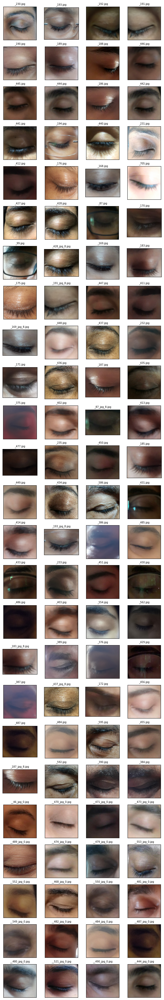

In [39]:
odd_size_images = imagelab.issues[imagelab.issues["is_odd_size_issue"] == True].sort_values(
    by=["odd_size_score"]
)
odd_size_image_files = odd_size_images.index.tolist()
existing_odd_size_image_files = [file for file in odd_size_image_files if os.path.exists(file)]
imagelab.visualize(image_files=existing_odd_size_image_files[:100])


In [40]:
# move_images(existing_odd_size_image_files, destination_dir)

# visualize the dark images



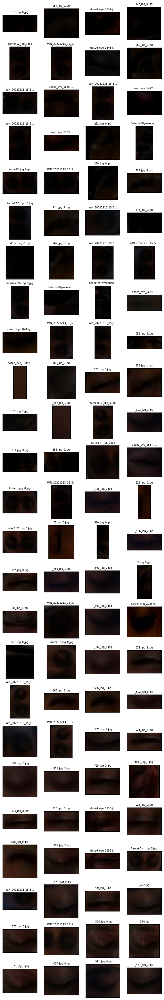

In [41]:
dark_images = imagelab.issues[imagelab.issues["is_dark_issue"] == True].sort_values(
    by=["dark_score"]
)
dark_image_files = dark_images.index.tolist()
existing_dark_image_files = [file for file in dark_image_files if os.path.exists(file)]
imagelab.visualize(image_files=existing_dark_image_files[:100])

In [42]:
move_images(existing_dark_image_files, destination_dir)

Moved: 137_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: 257_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: closed_eye_2132-jpg_face_3_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: 177_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: frame352_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: WIN_20221213_15_57_38_Pro-mp4_183_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: closed_eye_1648-jpg_face_2_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: 260_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: WIN_20221213_15_57_38_Pro-mp4_137_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: closed_eye_1856-jpg_face_1_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: WIN_20221213_15_57_38_Pro-mp4_041_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: closed_eye_1427-jpg_face_2_jpg_1.jpg 

# visualize the low_information images




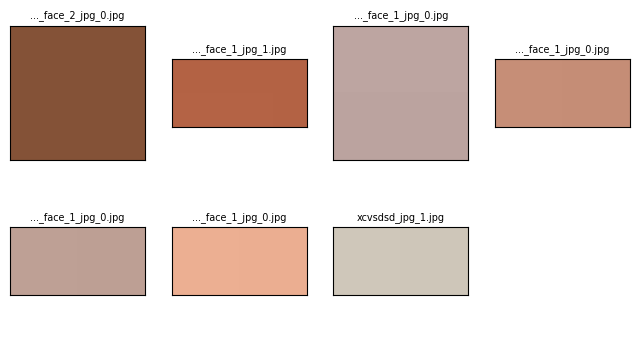

In [43]:
low_information_images = imagelab.issues[imagelab.issues["is_low_information_issue"] == True].sort_values(
    by=["low_information_score"]
)
low_information_image_files = low_information_images.index.tolist()
existing_low_information_image_files = [file for file in low_information_image_files if os.path.exists(file)]
imagelab.visualize(image_files=existing_low_information_image_files)



In [44]:
move_images(existing_low_information_image_files, destination_dir)

Moved: closed_eye_1844-png_face_2_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: closed_eye_1297-jpg_face_1_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: closed_eye_1132-jpg_face_1_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: closed_eye_2122-jpg_face_1_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: closed_eye_2137-jpg_face_1_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: closed_eye_2792-jpg_face_1_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: xcvsdsd_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye


# check again after removing the images with basic issues

Reading images from /Users/ahmedalkhulayfi/Desktop/Real-Time-Driver-Drowsiness-Detection/src/data/../../datasets/raw/Dataset_Before_Cleaning/Close_Eye
Checking for dark, light, odd_aspect_ratio, low_information, exact_duplicates, near_duplicates, blurry, grayscale, odd_size images ...


  0%|          | 0/12112 [00:00<?, ?it/s]

  0%|          | 0/12112 [00:00<?, ?it/s]

Issue checks completed. 6070 issues found in the dataset. To see a detailed report of issues found, use imagelab.report().
Issues found in images in order of severity in the dataset

|    | issue_type       |   num_images |
|---:|:-----------------|-------------:|
|  0 | blurry           |         2262 |
|  1 | grayscale        |         2000 |
|  2 | near_duplicates  |         1339 |
|  3 | exact_duplicates |          414 |
|  4 | odd_size         |           55 |
|  5 | dark             |            0 |
|  6 | light            |            0 |
|  7 | odd_aspect_ratio |            0 |
|  8 | low_information  |            0 | 

---------------------- blurry images -----------------------

Number of examples with this issue: 2262
Examples representing most severe instances of this issue:



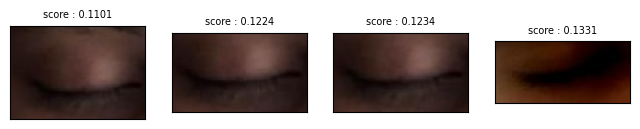

--------------------- grayscale images ---------------------

Number of examples with this issue: 2000
Examples representing most severe instances of this issue:



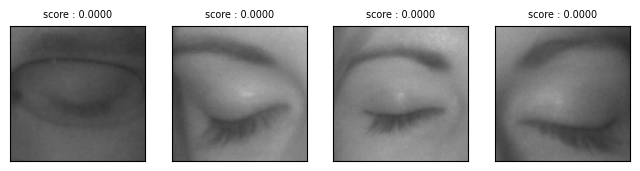

------------------ near_duplicates images ------------------

Number of examples with this issue: 1339
Examples representing most severe instances of this issue:

Set: 0


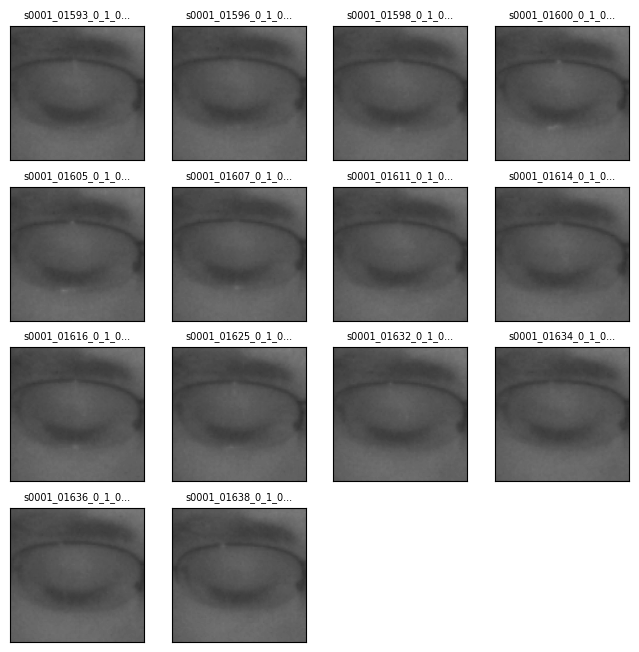

Set: 1


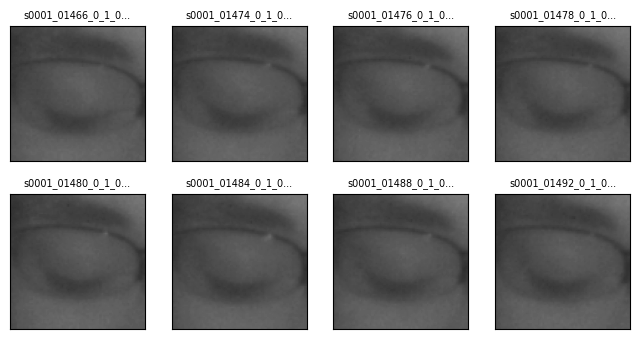

Set: 2


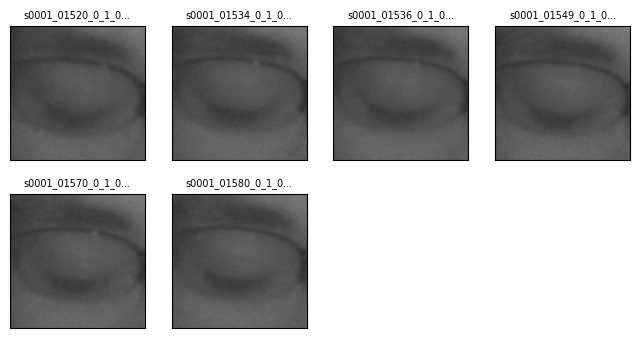

Set: 3


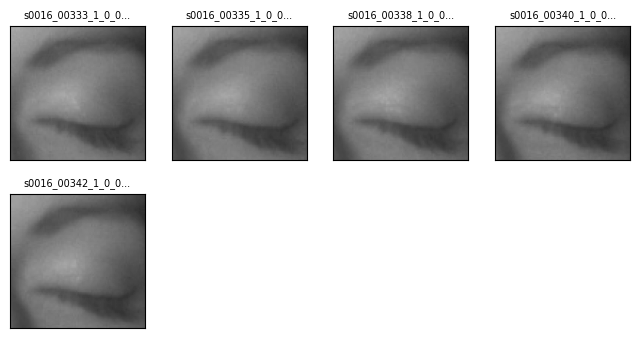

----------------- exact_duplicates images ------------------

Number of examples with this issue: 414
Examples representing most severe instances of this issue:

Set: 0


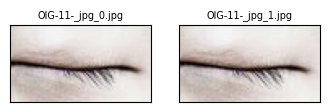

Set: 1


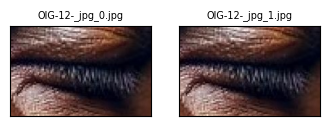

Set: 2


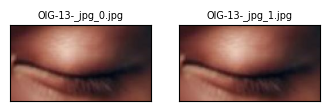

Set: 3


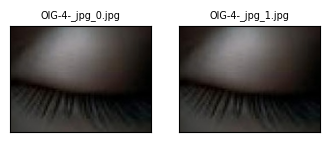

--------------------- odd_size images ----------------------

Number of examples with this issue: 55
Examples representing most severe instances of this issue:



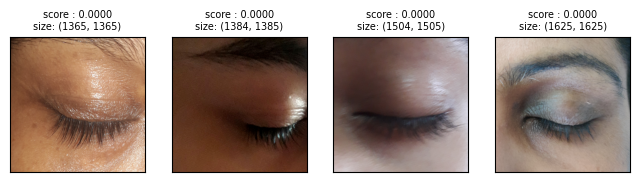

In [45]:
imagelab = Imagelab(data_path=source_dir)

# Automatically check for a predefined list of issues within your dataset
imagelab.find_issues()

# Produce a neat report of the issues found in your dataset
imagelab.report()

# visualize the near_duplicates images

Set: 0


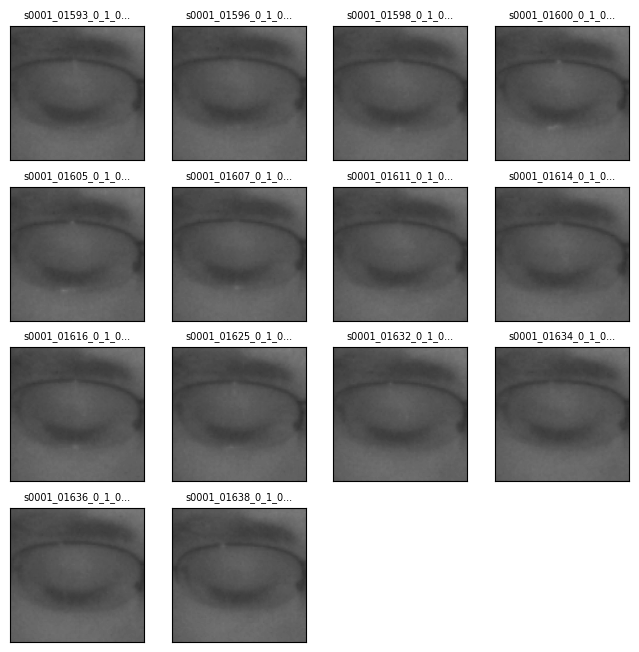

Set: 1


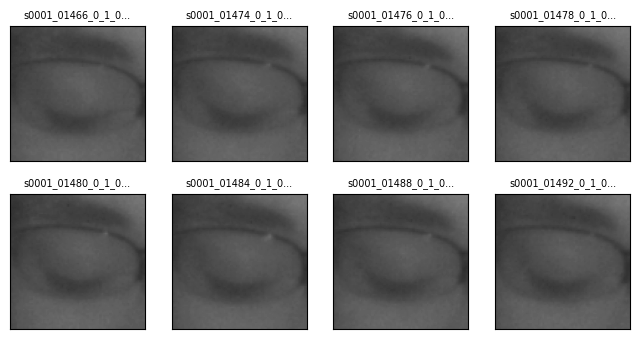

Set: 2


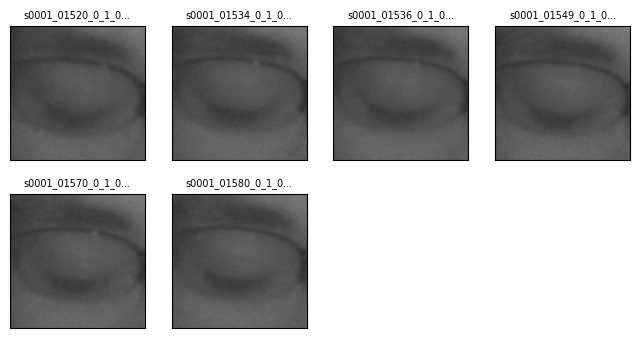

Set: 3


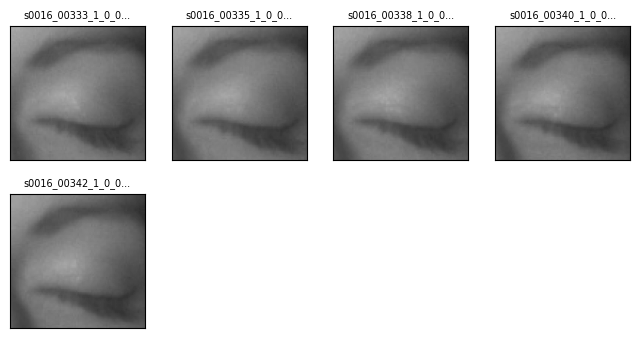

Set: 4


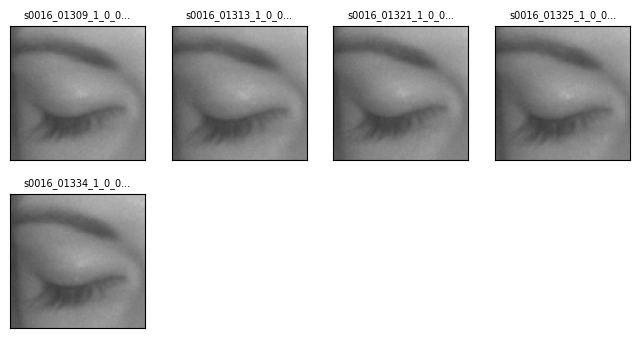

Set: 5


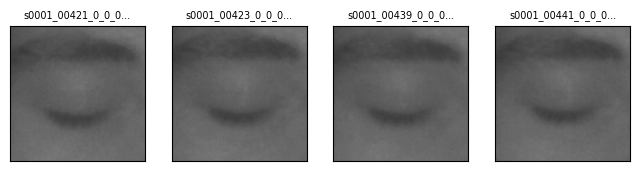

Set: 6


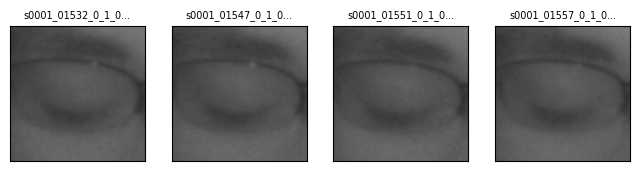

Set: 7


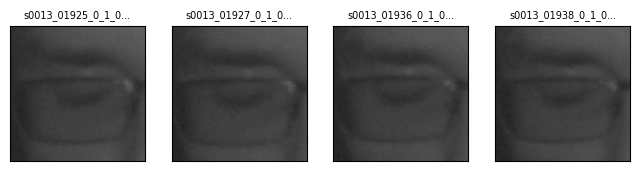

Set: 8


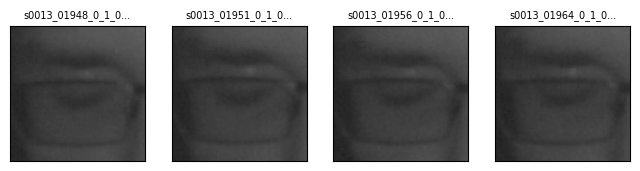

Set: 9


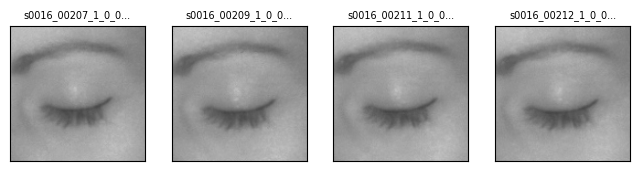

Set: 10


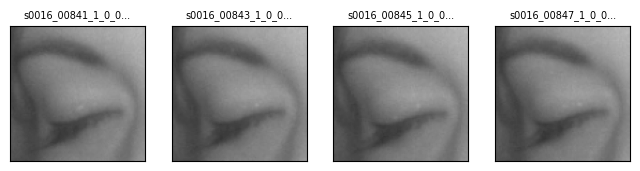

Set: 11


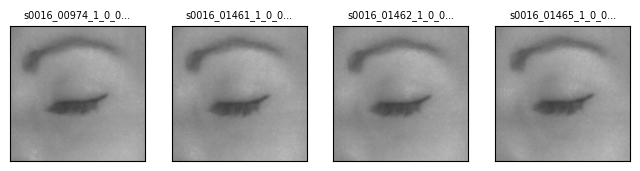

Set: 12


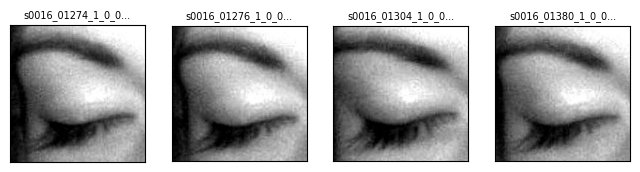

Set: 13


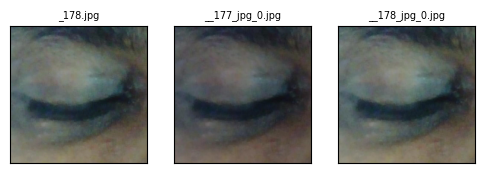

Set: 14


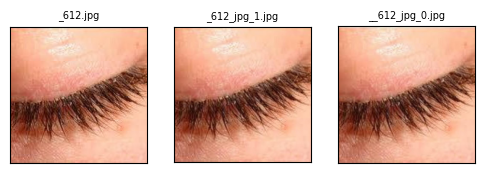

Set: 15


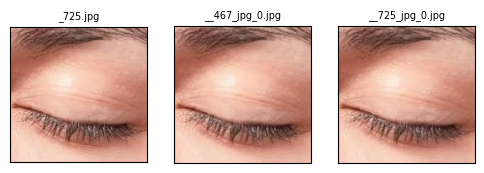

Set: 16


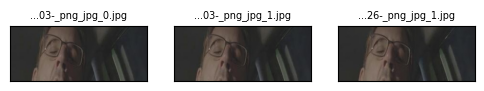

Set: 17


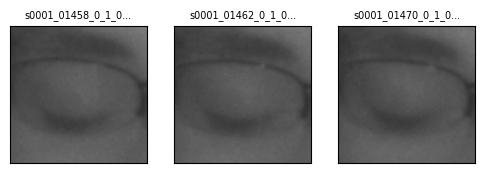

Set: 18


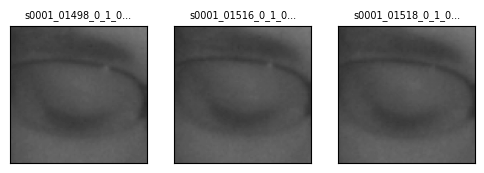

Set: 19


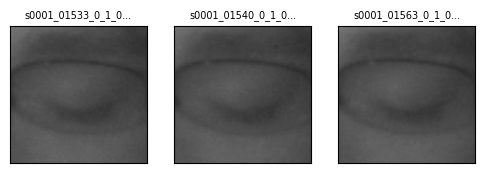

In [46]:
near_duplicates_images = imagelab.issues[imagelab.issues["is_near_duplicates_issue"] == True].sort_values(
    by=["near_duplicates_score"]
)
near_duplicates_files = near_duplicates_images.index.tolist()

existing_near_duplicates_files = [file for file in near_duplicates_files if os.path.exists(file)]

imagelab.visualize(issue_types=["near_duplicates"] , num_images=20)

In [47]:
# Assuming you have already identified the near duplicates
sets_len = imagelab.info["near_duplicates"]["num_sets"]


# Move non-unique images to the destination directory
non_unique_images = []
for i in range(sets_len):
    # Get all images in the current set
    current_set = imagelab.info["near_duplicates"]["sets"][i]
    
    # Move all but the first image in the set
    for img in current_set[1:]:  # Skip the first image
        non_unique_images.append(img)

# Move non-unique images to the destination directory
move_images(non_unique_images, destination_dir / "Near_Duplicates")

# Now, images_path_near_duplicates contains the unique images
print(f"From the total near_duplicates images: {len(existing_near_duplicates_files)}, Found: {sets_len} unique images")

Moved: 235_jpg_8.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Near_Duplicates
Moved: 374_jpg_8.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Near_Duplicates
Moved: 375_jpg_8.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Near_Duplicates
Moved: 45_jpg_8.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Near_Duplicates
Moved: 590_jpg_8.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Near_Duplicates
Moved: 617_jpg_8.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Near_Duplicates
Moved: 639_jpg_8.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Near_Duplicates
Moved: __10_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Near_Duplicates
Moved: __100_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Near_Duplicates
Moved: __101_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Near_Duplicates
Moved: __102_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Near_Duplicates
Moved: __103_jpg_0.jpg to 

# visualize the exact_duplicates images

Set: 0


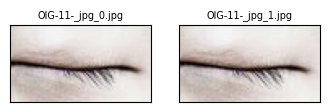

Set: 1


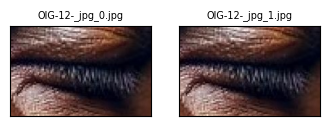

Set: 2


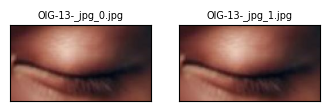

Set: 3


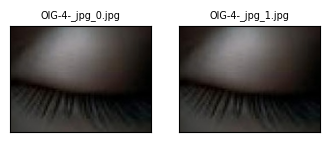

Set: 4


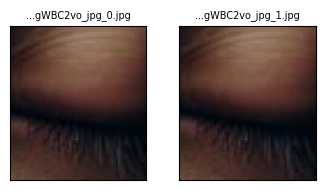

Set: 5


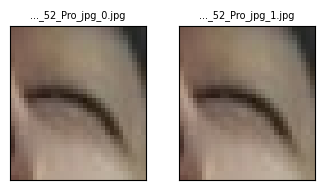

Set: 6


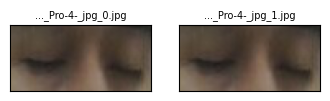

Set: 7


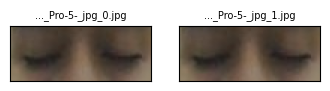

Set: 8


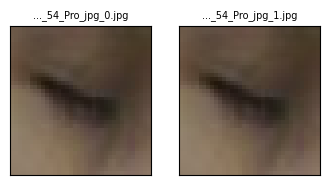

Set: 9


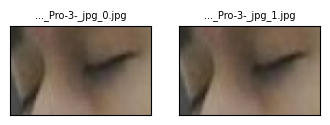

Set: 10


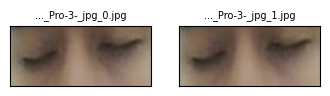

Set: 11


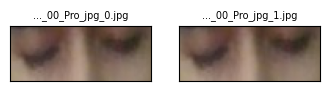

Set: 12


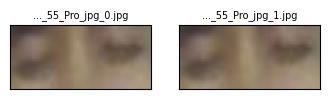

Set: 13


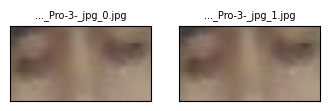

Set: 14


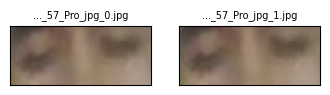

Set: 15


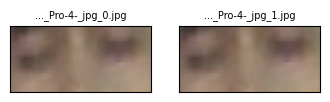

Set: 16


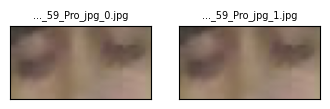

Set: 17


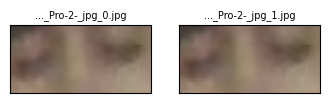

Set: 18


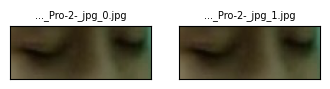

Set: 19


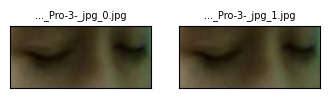

In [48]:
exact_duplicates_images = imagelab.issues[imagelab.issues["is_exact_duplicates_issue"] == True].sort_values(
    by=["exact_duplicates_score"]
)
exact_duplicates_files = exact_duplicates_images.index.tolist()

existing_exact_duplicates_files = [file for file in exact_duplicates_files if os.path.exists(file)]

imagelab.visualize(issue_types=["exact_duplicates"] , num_images=20)

In [49]:
sets_len = imagelab.info["exact_duplicates"]["num_sets"]


# Move non-unique images to the destination directory
non_unique_images = []
for i in range(sets_len):
    # Get all images in the current set
    current_set = imagelab.info["exact_duplicates"]["sets"][i]
    
    # Move all but the first image in the set
    for img in current_set[1:]:  # Skip the first image
        non_unique_images.append(img)

# Move non-unique images to the destination directory
move_images(non_unique_images, destination_dir / "Exact_Duplicates")

# Now, images_path_near_duplicates contains the unique images
print(f"From the total exact_duplicates images: {len(existing_exact_duplicates_files)}, Found: {sets_len} unique images")

Moved: OIG-11-_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Exact_Duplicates
Moved: OIG-12-_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Exact_Duplicates
Moved: OIG-13-_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Exact_Duplicates
Moved: OIG-4-_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Exact_Duplicates
Moved: OIG-gWBC2vo_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Exact_Duplicates
Moved: WIN_20220805_10_05_52_Pro_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Exact_Duplicates
Moved: WIN_20220805_10_05_54_Pro-4-_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Exact_Duplicates
Moved: WIN_20220805_10_05_54_Pro-5-_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Exact_Duplicates
Moved: WIN_20220805_10_05_54_Pro_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye/Exact_Duplicates
Moved: WIN_20220805_10_05_55_Pro-3-_jpg_1.jpg to ../../datasets/raw/Images_with_Is

# visualize the blurry images

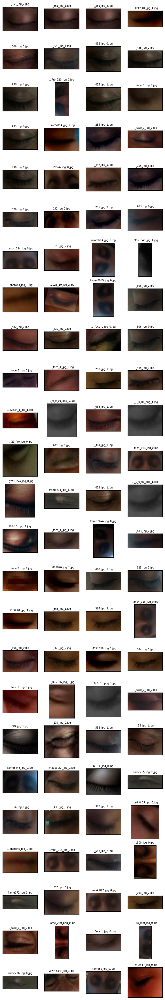

In [50]:
blurry_images = imagelab.issues[imagelab.issues["is_blurry_issue"] == True].sort_values(
    by=["blurry_score"]
)
blurry_image_files = blurry_images.index.tolist()
existing_blurry_image_files = [file for file in blurry_image_files if os.path.exists(file)]
imagelab.visualize(image_files=existing_blurry_image_files[:100])


In [51]:
move_images(existing_blurry_image_files, destination_dir)

Moved: _351_jpg_2.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _351_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _351_jpg_8.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: IMG20230504221212_01_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _306_jpg_2.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _629_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _438_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _435_jpg_2.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _438_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: WIN_20221213_15_57_38_Pro_220_jpg_0.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _435_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: closed_eye_0859-jpg_face_1_jpg_1.jpg to ../../datasets/raw/Images_with_Issues/Close_Eye
Moved: _435_jpg_0.jpg to ../../datasets/raw/Images_with_Issue

# final check



Reading images from /Users/ahmedalkhulayfi/Desktop/Real-Time-Driver-Drowsiness-Detection/src/data/../../datasets/raw/Dataset_Before_Cleaning/Close_Eye
Checking for dark, light, odd_aspect_ratio, low_information, exact_duplicates, near_duplicates, blurry, grayscale, odd_size images ...


  0%|          | 0/9123 [00:00<?, ?it/s]

  0%|          | 0/9123 [00:00<?, ?it/s]

Issue checks completed. 2126 issues found in the dataset. To see a detailed report of issues found, use imagelab.report().
Issues found in images in order of severity in the dataset

|    | issue_type       |   num_images |
|---:|:-----------------|-------------:|
|  0 | grayscale        |         1760 |
|  1 | odd_size         |          366 |
|  2 | dark             |            0 |
|  3 | light            |            0 |
|  4 | odd_aspect_ratio |            0 |
|  5 | low_information  |            0 |
|  6 | blurry           |            0 |
|  7 | exact_duplicates |            0 |
|  8 | near_duplicates  |            0 | 

--------------------- grayscale images ---------------------

Number of examples with this issue: 1760
Examples representing most severe instances of this issue:



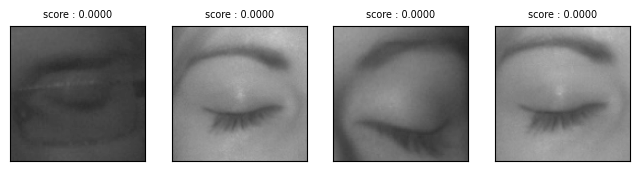

--------------------- odd_size images ----------------------

Number of examples with this issue: 366
Examples representing most severe instances of this issue:



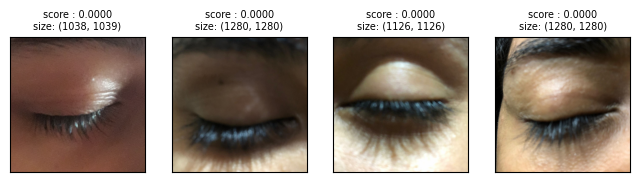

In [52]:
imagelab = Imagelab(data_path=source_dir)

# Automatically check for a predefined list of issues within your dataset
imagelab.find_issues()

# Produce a neat report of the issues found in your dataset
imagelab.report()

In [57]:

print('\033[92m' + 'Ahmed')
print('\033[94m' + 'Alkhulayfi')

\Ahmed
Alkhulayfi


<>:1: SyntaxWarning: invalid escape sequence '\['
<>:1: SyntaxWarning: invalid escape sequence '\['
/var/folders/jc/gg0g8k9x0n1cj1b8d04f93p80000gn/T/ipykernel_17240/2181336739.py:1: SyntaxWarning: invalid escape sequence '\['
  print('\' + 'Ahmed')
